# Biulding a Regression Model(flat resale prices)

In [10]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [11]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [12]:
#importing modules
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [14]:
# Importing flat.csv
flat= pd.read_csv(r"/content/drive/MyDrive/surge_classes/Regression/ALL Prices 1990-2021 mar.csv", header=0)

In [ ]:
flat.shape

In [ ]:
flat.head()

In [15]:
#5 number summary
flat.describe()

,year,town_dummy,latitude,longitude,storey,area_sqm,lease_start,lease_rem,resale_price,price_psm,price_psm_yearly,Core CPI,price cpi_adj,price_psm cpi_adj,bala lease pct,price lease_adj implied,price_psm lease_adj implied,price cpi_lease_adj implied,price_psm cpi_lease_adj implied,year_gni
count,840918.000000,840918.000000,840918.000000,840918.000000,840918.000000,840918.000000,840918.000000,840918.000000,8.409180e+05,840918.000000,840918.000000,840918.000000,8.409180e+05,840918.000000,840918.000000,8.409180e+05,840918.000000,8.409180e+05,840918.000000,840918.000000
mean,2004.512196,3.892261,1.361102,103.839049,7.567124,95.608704,1987.313952,81.780300,2.968002e+05,3062.232943,38.780054,80.222704,3.607913e+05,3718.709303,90.998891,3.142900e+05,3262.187707,3.808532e+05,3948.732221,49518.956025
std,8.135802,1.403197,0.041576,0.073889,4.657776,26.026266,9.637392,9.959341,1.509764e+05,1299.310863,19.256850,10.545238,1.616870e+05,1241.736956,4.407041,1.614892e+05,1453.964069,1.696361e+05,1381.597677,15844.785659
min,1990.000000,1.000000,1.266682,103.685206,2.000000,28.000000,1966.000000,45.000000,5.000000e+03,161.290323,1.920123,61.478000,8.074414e+03,260.464961,71.800000,5.183585e+03,167.212429,8.370883e+03,270.028469,22901.000000
25%,1998.000000,2.000000,1.333346,103.772844,5.000000,73.000000,1980.000000,75.000000,1.830000e+05,2238.095238,26.435374,72.429000,2.432166e+05,2975.961115,88.500000,1.932075e+05,2331.203240,2.583465e+05,3106.848880,37363.000000
50%,2003.000000,4.000000,1.354131,103.842792,8.000000,93.000000,1986.000000,83.000000,2.780000e+05,2797.619048,33.491765,75.954000,3.442474e+05,3610.835922,92.200000,2.931064e+05,2917.886452,3.652154e+05,3793.907869,40870.000000
75%,2010.000000,5.000000,1.380824,103.897752,11.000000,114.000000,1995.000000,90.000000,3.870000e+05,3818.181818,48.392057,87.810000,4.564779e+05,4399.740077,94.600000,4.103072e+05,4092.702169,4.799981e+05,4687.830912,63712.000000
max,2021.000000,6.000000,1.457052,103.988777,50.000000,307.000000,2019.000000,101.000000,1.258000e+06,12762.236560,211.640210,100.400000,1.260787e+06,12798.071160,96.000000,1.492913e+06,13599.370898,1.502756e+06,14036.901102,79517.000000


In [16]:
flat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840918 entries, 0 to 840917
Data columns (total 28 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   month                            840918 non-null  object 
 1   year                             840918 non-null  int64  
 2   town                             840918 non-null  object 
 3   town_dummy                       840918 non-null  int64  
 4   flat_type                        840918 non-null  object 
 5   block                            840918 non-null  object 
 6   street_name                      840918 non-null  object 
 7   address                          840918 non-null  object 
 8   latitude                         840918 non-null  float64
 9   longitude                        840918 non-null  float64
 10  storey_range                     840918 non-null  object 
 11  storey                           840918 non-null  int64  
 12  ar

In [17]:
flat['flat_type'].value_counts()

4 ROOM              315272
3 ROOM              275698
5 ROOM              174260
EXECUTIVE            63838
2 ROOM               10059
1 ROOM                1280
MULTI GENERATION       511
Name: flat_type, dtype: int64

In [18]:
flat['flat_model'].value_counts()

Model A                   233098
Improved                  221001
New Generation            179236
Simplified                 54422
Standard                   40278
Premium Apartment          36776
Apartment                  32596
Maisonette                 27388
Model A2                    9232
DBSS                        1957
Model A-Maisonette          1921
Adjoined flat               1112
Terrace                      652
Type S1                      293
MULTI GENERATION             279
Multi Generation             232
Type S2                      146
Improved-Maisonette          116
Premium Maisonette            83
Premium Apartment Loft        57
2-room                        22
2-ROOM                        21
Name: flat_model, dtype: int64

In [19]:
a=['month','town','flat_type','block','street_name','address','storey_range','flat_model']
for i in a:
    print(flat[i].value_counts())

1999-03    6468
1999-06    5862
1998-10    5709
1999-04    5698
1999-05    5671
           ... 
1991-02     816
1990-10     810
1990-05     778
2020-04     424
2020-05     363
Name: month, Length: 375, dtype: int64
TAMPINES           74167
YISHUN             64104
BEDOK              62194
JURONG WEST        61500
WOODLANDS          59458
ANG MO KIO         48805
HOUGANG            46213
BUKIT BATOK        40806
CHOA CHU KANG      34002
BUKIT MERAH        31067
PASIR RIS          30777
TOA PAYOH          28978
QUEENSTOWN         26407
CLEMENTI           26135
GEYLANG            26056
SENGKANG           25278
BUKIT PANJANG      24867
KALLANG/WHAMPOA    24437
JURONG EAST        23167
SERANGOON          21404
BISHAN             19859
PUNGGOL            13656
SEMBAWANG          11234
MARINE PARADE       7485
CENTRAL AREA        6471
BUKIT TIMAH         2327
LIM CHU KANG          64
Name: town, dtype: int64
4 ROOM              315272
3 ROOM              275698
5 ROOM              174260
EXEC

# data visualizing

In [ ]:
flat1=flat
flat1.head()

,month,year,town,town_dummy,flat_type,block,street_name,address,latitude,longitude,...,price_psm_yearly,Core CPI,price cpi_adj,price_psm cpi_adj,bala lease pct,price lease_adj implied,price_psm lease_adj implied,price cpi_lease_adj implied,price_psm cpi_lease_adj implied,year_gni
0,1990-01,1990,ANG MO KIO,2,4 ROOM,308,ANG MO KIO AVE 1,308 ANG MO KIO AVE 1 SINGAPORE,1.365485,103.844025,...,10.997442,61.59,139633.05730,1517.750623,92.9,88869.752422,965.975570,144292.502700,1568.396769,22901
1,1990-01,1990,ANG MO KIO,2,3 ROOM,308,ANG MO KIO AVE 1,308 ANG MO KIO AVE 1 SINGAPORE,1.365485,103.844025,...,8.464849,61.59,95794.77188,1168.228925,92.9,60968.783638,743.521752,98991.368143,1207.211806,22901
2,1990-01,1990,ANG MO KIO,2,3 ROOM,216,ANG MO KIO AVE 1,216 ANG MO KIO AVE 1 SINGAPORE,1.366272,103.841465,...,7.606769,61.59,76635.81750,1049.805719,92.9,48775.026911,668.151054,79193.094510,1084.836911,22901
3,1990-01,1990,ANG MO KIO,2,3 ROOM,308,ANG MO KIO AVE 1,308 ANG MO KIO AVE 1 SINGAPORE,1.365485,103.844025,...,8.287972,61.59,76635.81750,1143.818172,92.9,48775.026911,727.985476,79193.094510,1181.986486,22901
4,1990-01,1990,ANG MO KIO,2,4 ROOM,211,ANG MO KIO AVE 3,211 ANG MO KIO AVE 3 SINGAPORE,1.369226,103.841652,...,11.484353,61.59,129891.21610,1603.595261,93.3,82315.112540,1016.235957,133650.125891,1650.001555,22901


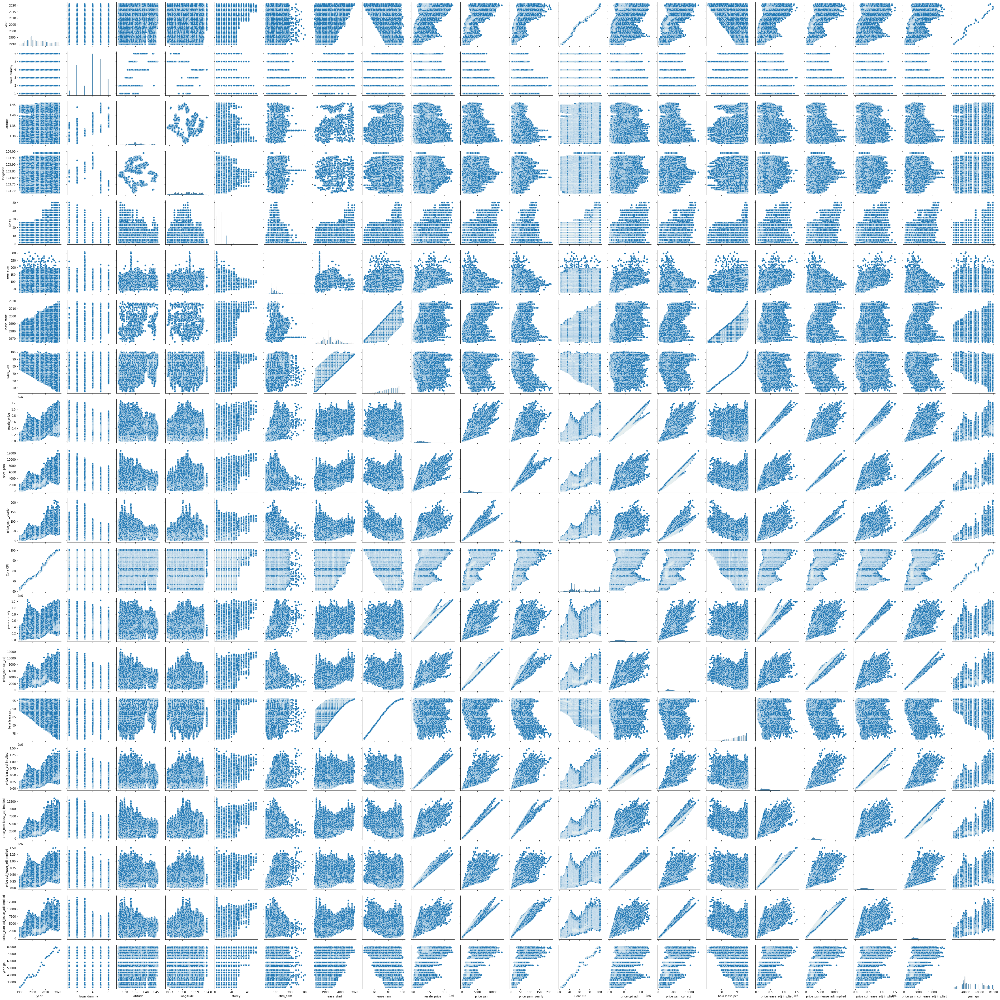

In [ ]:
#pair plot
sns.pairplot(flat1)
plt.show()

<AxesSubplot:xlabel='flat_model', ylabel='resale_price'>

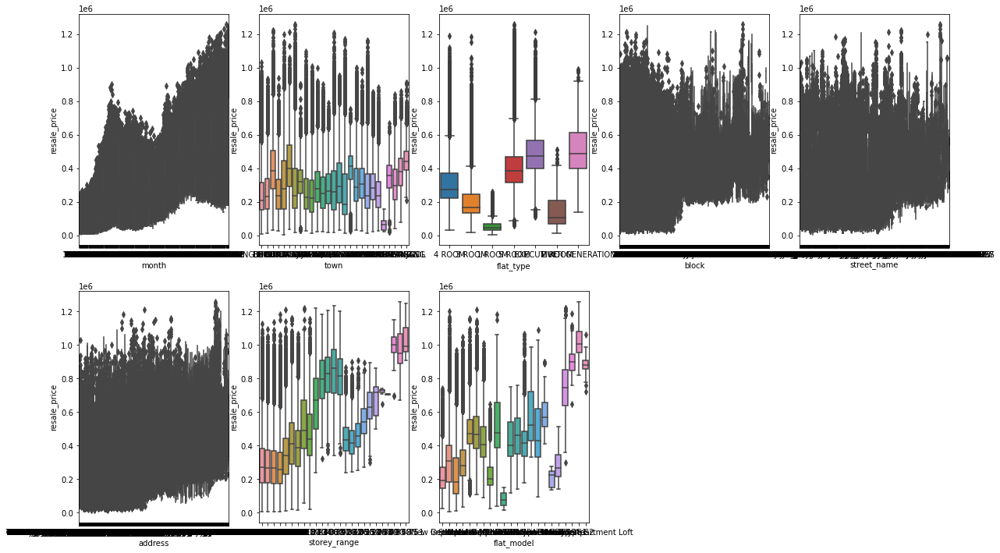

In [ ]:
#box plot
plt.figure(figsize=(20, 12))
plt.subplot(2,5,1)
sns.boxplot(x = 'month', y = 'resale_price', data = flat1)
plt.subplot(2,5,2)
sns.boxplot(x = 'town', y = 'resale_price', data = flat1)
plt.subplot(2,5,3)
sns.boxplot(x = 'flat_type', y = 'resale_price', data = flat1)
plt.subplot(2,5,4)
sns.boxplot(x = 'block', y = 'resale_price', data = flat1)
plt.subplot(2,5,5)
sns.boxplot(x = 'street_name', y = 'resale_price', data = flat1)
plt.subplot(2,5,6)
sns.boxplot(x = 'address', y = 'resale_price', data = flat1)
plt.subplot(2,5,7)
sns.boxplot(x = 'storey_range', y = 'resale_price', data = flat1)
plt.subplot(2,5,8)
sns.boxplot(x = 'flat_model', y = 'resale_price', data = flat1)

In [ ]:
data=flat1

<AxesSubplot:>

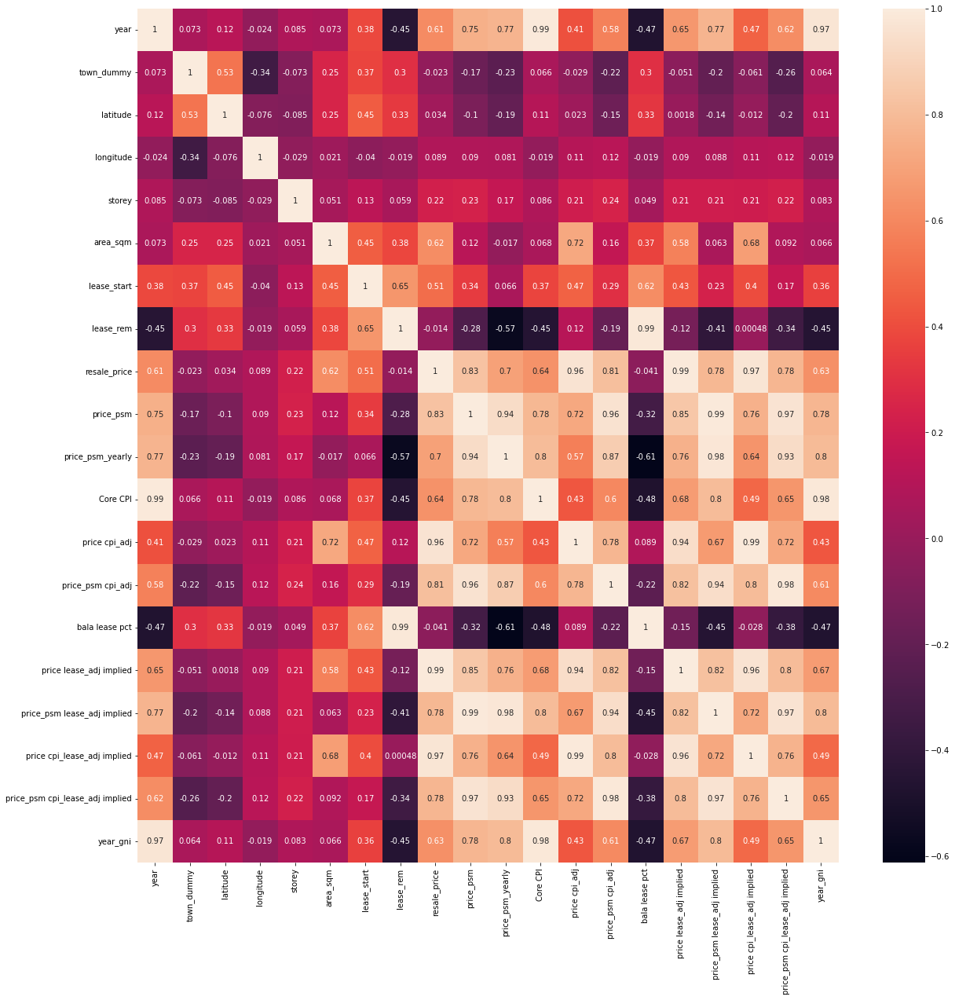

In [ ]:
#heat map
plt.rcParams['figure.figsize']=[20,20]
sns.heatmap(data.corr(),annot=True)

# Data Preparation

In [ ]:
#checking null values
flat.isnull().any()

month                              False
year                               False
town                               False
town_dummy                         False
flat_type                          False
block                              False
street_name                        False
address                            False
latitude                           False
longitude                          False
storey_range                       False
storey                             False
area_sqm                           False
flat_model                         False
lease_start                        False
lease_rem                          False
resale_price                       False
price_psm                          False
price_psm_yearly                   False
Core CPI                           False
price cpi_adj                      False
price_psm cpi_adj                  False
bala lease pct                     False
price lease_adj implied            False
price_psm lease_

In [ ]:
#prforming label encoding
from sklearn.preprocessing import LabelEncoder
encoder= LabelEncoder()
flat['town'] = encoder.fit_transform(flat['town'])
flat['month'] = encoder.fit_transform(flat['month'])
flat['block'] = encoder.fit_transform(flat['block'])
flat['street_name'] = encoder.fit_transform(flat['street_name'])
flat['address'] = encoder.fit_transform(flat['address'])
flat['storey_range'] = encoder.fit_transform(flat['storey_range'])

In [ ]:
# Get the dummy variables for the feature 'flat_type' and store it in a new variable - 'status1'

status1 = pd.get_dummies(flat['flat_type'])

# Check what the dataset 'status1' looks like
status1.head()

,1 ROOM,2 ROOM,3 ROOM,4 ROOM,5 ROOM,EXECUTIVE,MULTI GENERATION
0,0,0,0,1,0,0,0
1,0,0,1,0,0,0,0
2,0,0,1,0,0,0,0
3,0,0,1,0,0,0,0
4,0,0,0,1,0,0,0


In [ ]:
# Get the dummy variables for the feature 'flat_model' and store it in a new variable - 'status2'

status2 = pd.get_dummies(flat['flat_model'])

# Check what the dataset 'status2' looks like
status2.head()

,2-ROOM,2-room,Adjoined flat,Apartment,DBSS,Improved,Improved-Maisonette,MULTI GENERATION,Maisonette,Model A,...,Multi Generation,New Generation,Premium Apartment,Premium Apartment Loft,Premium Maisonette,Simplified,Standard,Terrace,Type S1,Type S2
0,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
# Let's drop the first column from status df using 'drop_first = True'
status1 = pd.get_dummies(flat['flat_type'], drop_first = True)
status2 = pd.get_dummies(flat['flat_model'], drop_first = True)

# Add the results to the original flat dataframe
flat = pd.concat([flat, status1,status2], axis = 1)

# Now let's see the head of our dataframe.
flat.head()

,month,year,town,town_dummy,flat_type,block,street_name,address,latitude,longitude,...,Multi Generation,New Generation,Premium Apartment,Premium Apartment Loft,Premium Maisonette,Simplified,Standard,Terrace,Type S1,Type S2
0,0,1990,0,2,4 ROOM,781,12,3654,1.365485,103.844025,...,0,1,0,0,0,0,0,0,0,0
1,0,1990,0,2,3 ROOM,781,12,3654,1.365485,103.844025,...,0,1,0,0,0,0,0,0,0,0
2,0,1990,0,2,3 ROOM,424,12,2288,1.366272,103.841465,...,0,1,0,0,0,0,0,0,0,0
3,0,1990,0,2,3 ROOM,781,12,3654,1.365485,103.844025,...,0,1,0,0,0,0,0,0,0,0
4,0,1990,0,2,4 ROOM,407,15,2202,1.369226,103.841652,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
# Drop 'flat_type','flat_model' as we have created the dummies for it
flat.drop(['flat_type'], axis = 1, inplace = True)
flat.drop(['flat_model'], axis = 1, inplace = True)

flat.head()

,month,year,town,town_dummy,block,street_name,address,latitude,longitude,storey_range,...,Multi Generation,New Generation,Premium Apartment,Premium Apartment Loft,Premium Maisonette,Simplified,Standard,Terrace,Type S1,Type S2
0,0,1990,0,2,781,12,3654,1.365485,103.844025,5,...,0,1,0,0,0,0,0,0,0,0
1,0,1990,0,2,781,12,3654,1.365485,103.844025,4,...,0,1,0,0,0,0,0,0,0,0
2,0,1990,0,2,424,12,2288,1.366272,103.841465,2,...,0,1,0,0,0,0,0,0,0,0
3,0,1990,0,2,781,12,3654,1.365485,103.844025,5,...,0,1,0,0,0,0,0,0,0,0
4,0,1990,0,2,407,15,2202,1.369226,103.841652,2,...,0,1,0,0,0,0,0,0,0,0


## Splitting the Data into Training and Testing Sets

In [ ]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively

df_train, df_test = train_test_split(flat, train_size = 0.7, test_size = 0.3, random_state = 100)

### Rescaling the Features

We will use MinMax scaling.

In [ ]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [ ]:
flat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 840918 entries, 0 to 840917
Data columns (total 53 columns):
 #   Column                           Non-Null Count   Dtype  
---  ------                           --------------   -----  
 0   month                            840918 non-null  int32  
 1   year                             840918 non-null  int64  
 2   town                             840918 non-null  int32  
 3   town_dummy                       840918 non-null  int64  
 4   block                            840918 non-null  int32  
 5   street_name                      840918 non-null  int32  
 6   address                          840918 non-null  int32  
 7   latitude                         840918 non-null  float64
 8   longitude                        840918 non-null  float64
 9   storey_range                     840918 non-null  int32  
 10  storey                           840918 non-null  int64  
 11  area_sqm                         840918 non-null  float64
 12  le

In [ ]:
#divide my data to numerical dataframe and categorical dataframe

#create separate numerical dataframe for numerical columns inclusing both float64 and int64 datatypes

flat_num=flat.select_dtypes(include=['float64','int64','int32'])

flat_num_col=flat_num.columns.tolist()
flat_num_col

['month',
 'year',
 'town',
 'town_dummy',
 'block',
 'street_name',
 'address',
 'latitude',
 'longitude',
 'storey_range',
 'storey',
 'area_sqm',
 'lease_start',
 'lease_rem',
 'resale_price',
 'price_psm',
 'price_psm_yearly',
 'Core CPI',
 'price cpi_adj',
 'price_psm cpi_adj',
 'bala lease pct',
 'price lease_adj implied',
 'price_psm lease_adj implied',
 'price cpi_lease_adj implied',
 'price_psm cpi_lease_adj implied',
 'year_gni']

In [ ]:
# Apply scaler() to all the columns except the 'label encoding' and 'dummy' variables

df_train[flat_num_col] = scaler.fit_transform(df_train[flat_num_col])

df_train.head()

,month,year,town,town_dummy,block,street_name,address,latitude,longitude,storey_range,...,Multi Generation,New Generation,Premium Apartment,Premium Apartment Loft,Premium Maisonette,Simplified,Standard,Terrace,Type S1,Type S2
574568,0.617647,0.612903,1.000000,0.8,0.803109,0.982487,0.868337,0.839821,0.480122,0.083333,...,0,0,0,0,0,1,0,0,0,0
830170,0.989305,0.967742,0.615385,0.4,0.349940,0.553415,0.430597,0.189095,0.747646,0.166667,...,0,0,0,0,0,0,0,0,0,0
410503,0.433155,0.419355,0.384615,0.4,0.428059,0.229422,0.514286,0.317376,0.661988,0.083333,...,0,0,0,0,0,0,0,0,0,0
275538,0.310160,0.290323,0.538462,0.4,0.033878,0.584939,0.066418,0.197547,0.585197,0.291667,...,0,0,0,0,0,0,1,0,0,0
331863,0.360963,0.354839,0.346154,0.2,0.797529,0.252189,0.858102,0.195973,0.252616,0.208333,...,0,1,0,0,0,0,0,0,0,0


In [ ]:
df_train.shape

(588642, 53)

### Dividing into X and Y sets for the model building

In [ ]:
y_train = df_train.pop('resale_price')
X_train = df_train

## Building our model

This time, we will be using the **LinearRegression function from SciKit Learn** for its compatibility with RFE (which is a utility from sklearn)

### RFE
Recursive feature elimination

In [ ]:
# Importing RFE and LinearRegression
from sklearn.feature_selection import RFE
from sklearn.linear_model import LinearRegression

In [ ]:
# Running RFE with the output number of the variable equal to 10
lm = LinearRegression()
lm.fit(X_train, y_train)

rfe = RFE(lm,25)             # running RFE
rfe = rfe.fit(X_train, y_train)

In [ ]:
list(zip(X_train.columns,rfe.support_,rfe.ranking_))

[('month', True, 1),
 ('year', True, 1),
 ('town', False, 22),
 ('town_dummy', False, 26),
 ('block', False, 28),
 ('street_name', False, 27),
 ('address', False, 23),
 ('latitude', False, 20),
 ('longitude', False, 21),
 ('storey_range', True, 1),
 ('storey', True, 1),
 ('area_sqm', True, 1),
 ('lease_start', True, 1),
 ('lease_rem', True, 1),
 ('price_psm', True, 1),
 ('price_psm_yearly', True, 1),
 ('Core CPI', False, 25),
 ('price cpi_adj', True, 1),
 ('price_psm cpi_adj', True, 1),
 ('bala lease pct', True, 1),
 ('price lease_adj implied', True, 1),
 ('price_psm lease_adj implied', True, 1),
 ('price cpi_lease_adj implied', True, 1),
 ('price_psm cpi_lease_adj implied', True, 1),
 ('year_gni', False, 14),
 ('2 ROOM', False, 19),
 ('3 ROOM', True, 1),
 ('4 ROOM', True, 1),
 ('5 ROOM', True, 1),
 ('EXECUTIVE', True, 1),
 ('MULTI GENERATION', False, 24),
 ('2-room', False, 13),
 ('Adjoined flat', False, 16),
 ('Apartment', True, 1),
 ('DBSS', False, 18),
 ('Improved', False, 5),
 ('I

In [ ]:
col = X_train.columns[rfe.support_]
col

Index(['month', 'year', 'storey_range', 'storey', 'area_sqm', 'lease_start',
       'lease_rem', 'price_psm', 'price_psm_yearly', 'price cpi_adj',
       'price_psm cpi_adj', 'bala lease pct', 'price lease_adj implied',
       'price_psm lease_adj implied', 'price cpi_lease_adj implied',
       'price_psm cpi_lease_adj implied', '3 ROOM', '4 ROOM', '5 ROOM',
       'EXECUTIVE', 'Apartment', 'Maisonette', 'Premium Apartment Loft',
       'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
X_train.columns[~rfe.support_]

Index(['town', 'town_dummy', 'block', 'street_name', 'address', 'latitude',
       'longitude', 'Core CPI', 'year_gni', '2 ROOM', 'MULTI GENERATION',
       '2-room', 'Adjoined flat', 'DBSS', 'Improved', 'Improved-Maisonette',
       'MULTI GENERATION', 'Model A', 'Model A-Maisonette', 'Model A2',
       'Multi Generation', 'New Generation', 'Premium Apartment', 'Simplified',
       'Standard', 'Type S1', 'Type S2'],
      dtype='object')

### Building model using statsmodel, for the detailed statistics

In [ ]:
# Creating X_test dataframe with RFE selected variables
X_train_rfe = X_train[col]

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_rfe)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 3.185e+09
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:15:06   Log-Likelihood:             3.8884e+06
No. Observations:              588642   AIC:                        -7.777e+06
Df Residuals:                  588616   BIC:                        -7.776e+06
Df Model:                          25                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

In [ ]:
#droping the constant
X_train_rfe = X_train_lm.drop(['const'], axis=1)

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_rfe
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
13,price_psm lease_adj implied,284894.08
7,price_psm,161276.12
10,price_psm cpi_adj,79763.19
15,price_psm cpi_lease_adj implied,78057.80
8,price_psm_yearly,26068.50
14,price cpi_lease_adj implied,18897.19
9,price cpi_adj,11525.19
6,lease_rem,4914.92
11,bala lease pct,4070.10
1,year,3678.54


In [ ]:
#droping  feature with heighest VIF value
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied"], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.078e+09
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:15:33   Log-Likelihood:             3.5576e+06
No. Observations:              588642   AIC:                        -7.115e+06
Df Residuals:                  588617   BIC:                        -7.115e+06
Df Model:                          24                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
const     

In [ ]:
X_train_new.columns

Index(['month', 'year', 'storey_range', 'storey', 'area_sqm', 'lease_start',
       'lease_rem', 'price_psm', 'price_psm_yearly', 'price cpi_adj',
       'price_psm cpi_adj', 'bala lease pct', 'price lease_adj implied',
       'price cpi_lease_adj implied', 'price_psm cpi_lease_adj implied',
       '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', 'Apartment', 'Maisonette',
       'Premium Apartment Loft', 'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
14,price_psm cpi_lease_adj implied,57824.84
10,price_psm cpi_adj,57528.42
13,price cpi_lease_adj implied,16981.38
9,price cpi_adj,10436.29
7,price_psm,6195.34
8,price_psm_yearly,4613.34
1,year,3675.04
0,month,3600.30
6,lease_rem,2823.92
12,price lease_adj implied,2173.79


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 4.586e+08
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:15:57   Log-Likelihood:             3.2935e+06
No. Observations:              588642   AIC:                        -6.587e+06
Df Residuals:                  588618   BIC:                        -6.587e+06
Df Model:                          23                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const             

In [ ]:
X_train_new.columns

Index(['month', 'year', 'storey_range', 'storey', 'area_sqm', 'lease_start',
       'lease_rem', 'price_psm', 'price_psm_yearly', 'price cpi_adj',
       'price_psm cpi_adj', 'bala lease pct', 'price lease_adj implied',
       'price cpi_lease_adj implied', '3 ROOM', '4 ROOM', '5 ROOM',
       'EXECUTIVE', 'Apartment', 'Maisonette', 'Premium Apartment Loft',
       'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
13,price cpi_lease_adj implied,15076.24
9,price cpi_adj,8525.49
1,year,3624.48
7,price_psm,3604.29
0,month,3599.45
10,price_psm cpi_adj,2555.55
12,price lease_adj implied,2151.31
6,lease_rem,2048.69
11,bala lease pct,1551.49
8,price_psm_yearly,789.04


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 6.783e+07
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:16:19   Log-Likelihood:             2.7180e+06
No. Observations:              588642   AIC:                        -5.436e+06
Df Residuals:                  588619   BIC:                        -5.436e+06
Df Model:                          22                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

In [ ]:
X_train_new.columns

Index(['month', 'year', 'storey_range', 'storey', 'area_sqm', 'lease_start',
       'lease_rem', 'price_psm', 'price_psm_yearly', 'price cpi_adj',
       'price_psm cpi_adj', 'bala lease pct', 'price lease_adj implied',
       '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', 'Apartment', 'Maisonette',
       'Premium Apartment Loft', 'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,year,3619.34
0,month,3597.14
6,lease_rem,2025.30
10,price_psm cpi_adj,1651.45
7,price_psm,1534.78
11,bala lease pct,1510.43
9,price cpi_adj,1359.94
12,price lease_adj implied,845.05
8,price_psm_yearly,468.31
5,lease_start,270.01


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 7.106e+07
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:16:39   Log-Likelihood:             2.7180e+06
No. Observations:              588642   AIC:                        -5.436e+06
Df Residuals:                  588620   BIC:                        -5.436e+06
Df Model:                          21                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

In [ ]:
X_train_new.columns

Index(['month', 'storey_range', 'storey', 'area_sqm', 'lease_start',
       'lease_rem', 'price_psm', 'price_psm_yearly', 'price cpi_adj',
       'price_psm cpi_adj', 'bala lease pct', 'price lease_adj implied',
       '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', 'Apartment', 'Maisonette',
       'Premium Apartment Loft', 'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,lease_rem,1944.37
9,price_psm cpi_adj,1650.08
6,price_psm,1526.28
10,bala lease pct,1485.37
8,price cpi_adj,1359.56
11,price lease_adj implied,845.04
7,price_psm_yearly,462.66
4,lease_start,254.82
1,storey_range,228.29
2,storey,208.28


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 7.448e+07
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:16:57   Log-Likelihood:             2.7174e+06
No. Observations:              588642   AIC:                        -5.435e+06
Df Residuals:                  588621   BIC:                        -5.435e+06
Df Model:                          20                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

In [ ]:
X_train_new.columns

Index(['month', 'storey_range', 'storey', 'area_sqm', 'lease_start',
       'price_psm', 'price_psm_yearly', 'price cpi_adj', 'price_psm cpi_adj',
       'bala lease pct', 'price lease_adj implied', '3 ROOM', '4 ROOM',
       '5 ROOM', 'EXECUTIVE', 'Apartment', 'Maisonette',
       'Premium Apartment Loft', 'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
8,price_psm cpi_adj,1646.56
5,price_psm,1372.06
7,price cpi_adj,1354.99
10,price lease_adj implied,833.72
6,price_psm_yearly,300.72
1,storey_range,228.24
2,storey,208.28
3,area_sqm,186.01
9,bala lease pct,169.87
4,lease_start,83.89


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem','price_psm cpi_adj'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 5.376e+07
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:17:13   Log-Likelihood:             2.6065e+06
No. Observations:              588642   AIC:                        -5.213e+06
Df Residuals:                  588622   BIC:                        -5.213e+06
Df Model:                          19                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

In [ ]:
X_train_new.columns

Index(['month', 'storey_range', 'storey', 'area_sqm', 'lease_start',
       'price_psm', 'price_psm_yearly', 'price cpi_adj', 'bala lease pct',
       'price lease_adj implied', '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE',
       'Apartment', 'Maisonette', 'Premium Apartment Loft',
       'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
5,price_psm,551.57
7,price cpi_adj,337.78
6,price_psm_yearly,267.23
1,storey_range,228.18
9,price lease_adj implied,216.70
2,storey,208.21
3,area_sqm,162.79
8,bala lease pct,128.55
4,lease_start,64.02
0,month,49.96


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem','price_psm cpi_adj','price_psm'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 3.058e+07
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:17:27   Log-Likelihood:             2.4246e+06
No. Observations:              588642   AIC:                        -4.849e+06
Df Residuals:                  588623   BIC:                        -4.849e+06
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

In [ ]:
X_train_new.columns

Index(['month', 'storey_range', 'storey', 'area_sqm', 'lease_start',
       'price_psm_yearly', 'price cpi_adj', 'bala lease pct',
       'price lease_adj implied', '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE',
       'Apartment', 'Maisonette', 'Premium Apartment Loft',
       'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,storey_range,227.69
8,price lease_adj implied,215.40
6,price cpi_adj,214.86
2,storey,207.54
7,bala lease pct,117.01
3,area_sqm,101.49
5,price_psm_yearly,56.47
4,lease_start,51.20
0,month,49.17
10,4 ROOM,41.07


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem','price_psm cpi_adj','price_psm','storey_range'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.999
Model:                            OLS   Adj. R-squared:                  0.999
Method:                 Least Squares   F-statistic:                 3.235e+07
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:17:41   Log-Likelihood:             2.4244e+06
No. Observations:              588642   AIC:                        -4.849e+06
Df Residuals:                  588624   BIC:                        -4.849e+06
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
const                     

In [ ]:
X_train_new.columns

Index(['month', 'storey', 'area_sqm', 'lease_start', 'price_psm_yearly',
       'price cpi_adj', 'bala lease pct', 'price lease_adj implied', '3 ROOM',
       '4 ROOM', '5 ROOM', 'EXECUTIVE', 'Apartment', 'Maisonette',
       'Premium Apartment Loft', 'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,price lease_adj implied,215.24
5,price cpi_adj,214.85
6,bala lease pct,115.93
2,area_sqm,101.36
4,price_psm_yearly,56.43
3,lease_start,50.88
0,month,49.00
9,4 ROOM,41.06
10,5 ROOM,32.77
11,EXECUTIVE,31.90


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem','price_psm cpi_adj','price_psm','storey_range','price lease_adj implied'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.985
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                 2.355e+06
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:17:52   Log-Likelihood:             1.6397e+06
No. Observations:              588642   AIC:                        -3.279e+06
Df Residuals:                  588625   BIC:                        -3.279e+06
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [ ]:
X_train_new.columns

Index(['month', 'storey', 'area_sqm', 'lease_start', 'price_psm_yearly',
       'price cpi_adj', 'bala lease pct', '3 ROOM', '4 ROOM', '5 ROOM',
       'EXECUTIVE', 'Apartment', 'Maisonette', 'Premium Apartment Loft',
       'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
6,bala lease pct,106.10
2,area_sqm,101.12
5,price cpi_adj,66.16
4,price_psm_yearly,53.13
3,lease_start,50.46
0,month,42.54
8,4 ROOM,41.06
9,5 ROOM,32.76
10,EXECUTIVE,31.84
7,3 ROOM,25.50


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem','price_psm cpi_adj','price_psm','storey_range','price lease_adj implied','bala lease pct'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                 2.365e+06
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:18:01   Log-Likelihood:             1.6222e+06
No. Observations:              588642   AIC:                        -3.244e+06
Df Residuals:                  588626   BIC:                        -3.244e+06
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [ ]:
X_train_new.columns

Index(['month', 'storey', 'area_sqm', 'lease_start', 'price_psm_yearly',
       'price cpi_adj', '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', 'Apartment',
       'Maisonette', 'Premium Apartment Loft', 'Premium Maisonette',
       'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
2,area_sqm,90.09
5,price cpi_adj,64.45
4,price_psm_yearly,51.80
9,EXECUTIVE,30.66
7,4 ROOM,30.40
8,5 ROOM,28.59
0,month,24.38
3,lease_start,16.38
6,3 ROOM,12.10
10,Apartment,9.75


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem','price_psm cpi_adj','price_psm','storey_range','price lease_adj implied','bala lease pct','area_sqm'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.984
Model:                            OLS   Adj. R-squared:                  0.984
Method:                 Least Squares   F-statistic:                 2.529e+06
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:18:09   Log-Likelihood:             1.6216e+06
No. Observations:              588642   AIC:                        -3.243e+06
Df Residuals:                  588627   BIC:                        -3.243e+06
Df Model:                          14                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [ ]:
X_train_new.columns

Index(['month', 'storey', 'lease_start', 'price_psm_yearly', 'price cpi_adj',
       '3 ROOM', '4 ROOM', '5 ROOM', 'EXECUTIVE', 'Apartment', 'Maisonette',
       'Premium Apartment Loft', 'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
4,price cpi_adj,52.18
3,price_psm_yearly,44.46
0,month,23.00
8,EXECUTIVE,20.58
2,lease_start,15.88
9,Apartment,9.72
10,Maisonette,8.40
7,5 ROOM,7.22
6,4 ROOM,7.00
5,3 ROOM,3.12


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem','price_psm cpi_adj','price_psm','storey_range','price lease_adj implied','bala lease pct','area_sqm','price cpi_adj'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.912
Model:                            OLS   Adj. R-squared:                  0.912
Method:                 Least Squares   F-statistic:                 4.706e+05
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:18:16   Log-Likelihood:             1.1271e+06
No. Observations:              588642   AIC:                        -2.254e+06
Df Residuals:                  588628   BIC:                        -2.254e+06
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [ ]:
X_train_new.columns

Index(['month', 'storey', 'lease_start', 'price_psm_yearly', '3 ROOM',
       '4 ROOM', '5 ROOM', 'EXECUTIVE', 'Apartment', 'Maisonette',
       'Premium Apartment Loft', 'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
7,EXECUTIVE,18.46
0,month,15.85
3,price_psm_yearly,14.33
2,lease_start,11.40
8,Apartment,9.69
9,Maisonette,8.37
5,4 ROOM,5.45
6,5 ROOM,3.92
4,3 ROOM,3.12
1,storey,2.64


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem','price_psm cpi_adj','price_psm','storey_range','price lease_adj implied','bala lease pct','area_sqm','price cpi_adj','EXECUTIVE'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.901
Model:                            OLS   Adj. R-squared:                  0.901
Method:                 Least Squares   F-statistic:                 4.468e+05
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:18:22   Log-Likelihood:             1.0918e+06
No. Observations:              588642   AIC:                        -2.184e+06
Df Residuals:                  588629   BIC:                        -2.183e+06
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [ ]:
X_train_new.columns

Index(['month', 'storey', 'lease_start', 'price_psm_yearly', '3 ROOM',
       '4 ROOM', '5 ROOM', 'Apartment', 'Maisonette', 'Premium Apartment Loft',
       'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,month,15.84
3,price_psm_yearly,14.27
2,lease_start,10.88
5,4 ROOM,5.10
6,5 ROOM,3.69
4,3 ROOM,2.97
1,storey,2.63
7,Apartment,1.54
8,Maisonette,1.35
11,Terrace,1.01


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem','price_psm cpi_adj','price_psm','storey_range','price lease_adj implied','bala lease pct','area_sqm','price cpi_adj','EXECUTIVE','month'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.896
Model:                            OLS   Adj. R-squared:                  0.896
Method:                 Least Squares   F-statistic:                 4.603e+05
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:18:27   Log-Likelihood:             1.0767e+06
No. Observations:              588642   AIC:                        -2.153e+06
Df Residuals:                  588630   BIC:                        -2.153e+06
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     -0

In [ ]:
X_train_new.columns

Index(['storey', 'lease_start', 'price_psm_yearly', '3 ROOM', '4 ROOM',
       '5 ROOM', 'Apartment', 'Maisonette', 'Premium Apartment Loft',
       'Premium Maisonette', 'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,lease_start,7.83
4,4 ROOM,4.92
2,price_psm_yearly,4.58
5,5 ROOM,3.57
3,3 ROOM,2.90
0,storey,2.56
6,Apartment,1.51
7,Maisonette,1.31
10,Terrace,1.01
8,Premium Apartment Loft,1.00


In [ ]:
#droping  feature with heighest VIF value

In [ ]:
X_train_new = X_train_rfe.drop(["price_psm lease_adj implied",'price_psm cpi_lease_adj implied','price cpi_lease_adj implied','year','lease_rem','price_psm cpi_adj','price_psm','storey_range','price lease_adj implied','bala lease pct','area_sqm','price cpi_adj','EXECUTIVE','month','lease_start'], axis = 1)

In [ ]:
# Adding a constant variable
import statsmodels.api as sm
X_train_lm = sm.add_constant(X_train_new)

In [ ]:
lm = sm.OLS(y_train,X_train_lm).fit()   # Running the linear model

In [ ]:
#Let's see the summary of our linear model
print(lm.summary())

                            OLS Regression Results                            
Dep. Variable:           resale_price   R-squared:                       0.854
Model:                            OLS   Adj. R-squared:                  0.854
Method:                 Least Squares   F-statistic:                 3.435e+05
Date:                Sat, 28 Jan 2023   Prob (F-statistic):               0.00
Time:                        22:18:30   Log-Likelihood:             9.7668e+05
No. Observations:              588642   AIC:                        -1.953e+06
Df Residuals:                  588631   BIC:                        -1.953e+06
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                      0

In [ ]:
X_train_new.columns

Index(['storey', 'price_psm_yearly', '3 ROOM', '4 ROOM', '5 ROOM', 'Apartment',
       'Maisonette', 'Premium Apartment Loft', 'Premium Maisonette',
       'Terrace'],
      dtype='object')

In [ ]:
# Calculate the VIFs for the new model
from statsmodels.stats.outliers_influence import variance_inflation_factor

vif = pd.DataFrame()
X = X_train_new
vif['Features'] = X.columns
vif['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
1,price_psm_yearly,4.52
0,storey,2.53
3,4 ROOM,2.49
2,3 ROOM,2.27
4,5 ROOM,2.01
5,Apartment,1.16
6,Maisonette,1.13
9,Terrace,1.01
7,Premium Apartment Loft,1.00
8,Premium Maisonette,1.00


## Residual Analysis of the train data

So, now to check if the error terms are also normally distributed (which is infact, one of the major assumptions of linear regression), let us plot the histogram of the error terms and see what it looks like.

In [ ]:
y_train_resale_price = lm.predict(X_train_lm)

In [ ]:
# Importing the required libraries for plots.
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

Text(0.5, 0, 'Errors')

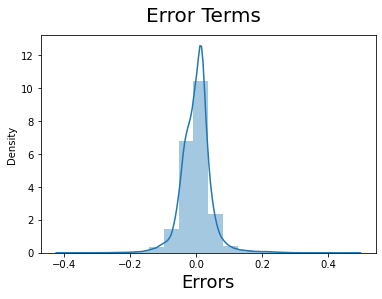

In [ ]:
# Plot the histogram of the error terms
fig = plt.figure()
sns.distplot((y_train - y_train_resale_price), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading
plt.xlabel('Errors', fontsize = 18)                         # X-label

## Making Predictions

#### Applying the scaling on the test sets

In [ ]:
df_test[flat_num_col] = scaler.transform(df_test[flat_num_col])

#### Dividing into X_test and y_test

In [ ]:
y_test = df_test.pop('resale_price')
X_test = df_test

In [ ]:
# Now let's use our model to make predictions.

# Creating X_test_new dataframe by dropping variables from X_test
X_test_new = X_test[X_train_new.columns]

# Adding a constant variable
X_test_new = sm.add_constant(X_test_new)

In [ ]:
# Making predictions
y_pred = lm.predict(X_test_new)

## Model Evaluation

Text(0, 0.5, 'y_pred')

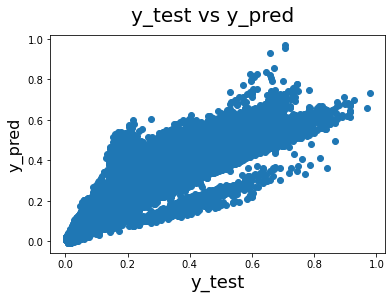

In [ ]:
# Plotting y_test and y_pred to understand the spread.
fig = plt.figure()
plt.scatter(y_test,y_pred)
fig.suptitle('y_test vs y_pred', fontsize=20)              # Plot heading
plt.xlabel('y_test', fontsize=18)                          # X-label
plt.ylabel('y_pred', fontsize=16)                          # Y-label

In [ ]:
from sklearn.metrics import r2_score

#Checking the R-squared on the test set

r_squared = r2_score(y_test, y_pred)
r_squared

0.8538566976802989